###### This data is for the purpose of bias correction of next-day maximum and minimum air temperatures forecast of the LDAPS model operated by the Korea Meteorological Administration over Seoul, South Korea. This data consists of summer data from 2013 to 2017. The input data is largely composed of the LDAPS model's next-day forecast data, in-situ maximum and minimum temperatures of present-day, and geographic auxiliary variables. There are two outputs (i.e. next-day maximum and minimum air temperatures) in this data. Hindcast validation was conducted for the period from 2015 to 2017.

In [1]:
# Importing the necessary libraries

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Let's load the dataset.

df_temp = pd.read_csv('temperature.csv')
df_temp.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,2013-06-30,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,2013-06-30,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,2013-06-30,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,2013-06-30,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,2013-06-30,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


In [3]:
# let's check the shape of the dataset.

df_temp.shape

(7752, 25)

The dataset has 7752 rows and 25 attributes including the target variable.

In [4]:
# let's  check  the data typw of each attribute in the dataset.

df_temp.dtypes

station             float64
Date                 object
Present_Tmax        float64
Present_Tmin        float64
LDAPS_RHmin         float64
LDAPS_RHmax         float64
LDAPS_Tmax_lapse    float64
LDAPS_Tmin_lapse    float64
LDAPS_WS            float64
LDAPS_LH            float64
LDAPS_CC1           float64
LDAPS_CC2           float64
LDAPS_CC3           float64
LDAPS_CC4           float64
LDAPS_PPT1          float64
LDAPS_PPT2          float64
LDAPS_PPT3          float64
LDAPS_PPT4          float64
lat                 float64
lon                 float64
DEM                 float64
Slope               float64
Solar radiation     float64
Next_Tmax           float64
Next_Tmin           float64
dtype: object

The whole dataset is of 'float64' except for the 'Date' which is of 'object' data type.

#### CONVERTING DATA TYPE

Converting the data type of 'Date' from object to integer and also extracting the date, month and year from the date.



In [5]:
# Converting the data type of 'Date' and extracting the day, month and year.

df_temp['Day'] = pd.to_datetime(df_temp.Date, format="%Y/%m/%d").dt.day
df_temp['Month'] = pd.to_datetime(df_temp.Date, format="%Y/%m/%d").dt.month
df_temp['Year'] = pd.to_datetime(df_temp.Date, format="%Y/%m/%d").dt.year

In [6]:
# Let's see the value counts of 'Day', 'Month' and 'Year'.

print("----Day---- \n",df_temp['Day'].value_counts())
print("\n")
print("----Month---- \n",df_temp['Month'].value_counts())
print("\n")
print("----Year---- \n",df_temp['Year'].value_counts())

----Day---- 
 30.0    375
14.0    250
1.0     250
2.0     250
3.0     250
4.0     250
5.0     250
6.0     250
7.0     250
8.0     250
9.0     250
10.0    250
11.0    250
12.0    250
13.0    250
15.0    250
29.0    250
16.0    250
18.0    250
20.0    250
22.0    250
24.0    250
26.0    250
28.0    250
17.0    250
19.0    250
21.0    250
23.0    250
25.0    250
27.0    250
31.0    125
Name: Day, dtype: int64


----Month---- 
 7.0    3875
8.0    3750
6.0     125
Name: Month, dtype: int64


----Year---- 
 2015.0    1550
2014.0    1550
2013.0    1550
2017.0    1550
2016.0    1550
Name: Year, dtype: int64


In [7]:
# Dropping the original 'Date' column from the dataset.

df_temp = df_temp.drop(['Date'], axis=1)
df_temp.head(2)

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Day,Month,Year
0,1.0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,...,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2,30.0,6.0,2013.0
1,2.0,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,...,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5,30.0,6.0,2013.0


In [8]:
# Let's again check the data type of the dataset.

df_temp.dtypes

station             float64
Present_Tmax        float64
Present_Tmin        float64
LDAPS_RHmin         float64
LDAPS_RHmax         float64
LDAPS_Tmax_lapse    float64
LDAPS_Tmin_lapse    float64
LDAPS_WS            float64
LDAPS_LH            float64
LDAPS_CC1           float64
LDAPS_CC2           float64
LDAPS_CC3           float64
LDAPS_CC4           float64
LDAPS_PPT1          float64
LDAPS_PPT2          float64
LDAPS_PPT3          float64
LDAPS_PPT4          float64
lat                 float64
lon                 float64
DEM                 float64
Slope               float64
Solar radiation     float64
Next_Tmax           float64
Next_Tmin           float64
Day                 float64
Month               float64
Year                float64
dtype: object

Now, the whole dataset is of 'float64' datatype.

In [9]:
df_temp.shape

(7752, 27)

The final dataset is having 27 columns.

#### CHECKING THE NULL VALUES

In [10]:
df_temp.isnull().sum()

station              2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
Day                  2
Month                2
Year                 2
dtype: int64

There are null values present in the whole dataset except of 'lat', 'lon', 'DEM', 'Slope' and 'Solar radiation'.

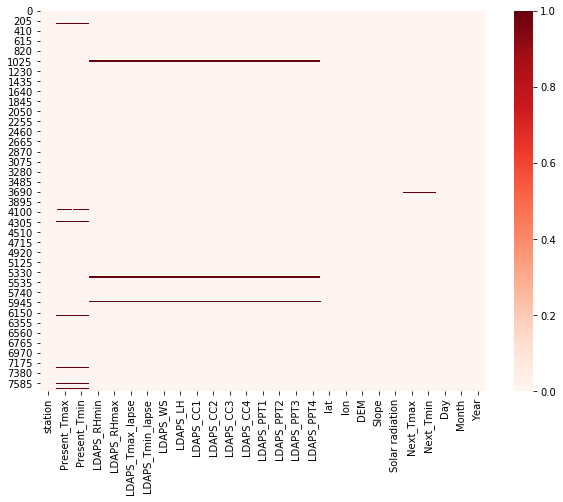

In [11]:
# Visualizing the null values using heatmap.

plt.figure(figsize=(10,7))
sns.heatmap(data = df_temp.isnull(), cmap='Reds')

#### FILLING THE MISSING VALUES

Handling the missing values of 'Day', 'Month' and 'Year'.



In [12]:
# Replacing the missing values with 0.

df_temp.Day = df_temp.Day.fillna(0)
df_temp.Month = df_temp.Month.fillna(0)
df_temp.Year = df_temp.Year.fillna(0)

Handling the missing values of other attributes.

In [13]:
# Filling the null values of the attributes with their respective median.

df_temp.station = df_temp.station.fillna(df_temp['station'].median())
df_temp.Present_Tmax = df_temp.Present_Tmax.fillna(df_temp['Present_Tmax'].median())
df_temp.Present_Tmin = df_temp.Present_Tmin.fillna(df_temp['Present_Tmin'].median())
df_temp.LDAPS_RHmin = df_temp.LDAPS_RHmin.fillna(df_temp['LDAPS_RHmin'].median())
df_temp.LDAPS_RHmax = df_temp.LDAPS_RHmax.fillna(df_temp['LDAPS_RHmax'].median())
df_temp.LDAPS_Tmax_lapse = df_temp.LDAPS_Tmax_lapse.fillna(df_temp['LDAPS_Tmax_lapse'].median())
df_temp.LDAPS_Tmin_lapse = df_temp.LDAPS_Tmin_lapse.fillna(df_temp['LDAPS_Tmin_lapse'].median())
df_temp.LDAPS_WS = df_temp.LDAPS_WS.fillna(df_temp['LDAPS_WS'].median())
df_temp.LDAPS_LH = df_temp.LDAPS_LH.fillna(df_temp['LDAPS_LH'].median())
df_temp.LDAPS_CC1 = df_temp.LDAPS_CC1.fillna(df_temp['LDAPS_CC1'].median())
df_temp.LDAPS_CC2 = df_temp.LDAPS_CC2.fillna(df_temp['LDAPS_CC2'].median())
df_temp.LDAPS_CC3 = df_temp.LDAPS_CC3.fillna(df_temp['LDAPS_CC3'].median())
df_temp.LDAPS_CC4 = df_temp.LDAPS_CC4.fillna(df_temp['LDAPS_CC4'].median())
df_temp.LDAPS_PPT1 = df_temp.LDAPS_PPT1.fillna(df_temp['LDAPS_PPT1'].median())
df_temp.LDAPS_PPT2 = df_temp.LDAPS_PPT2.fillna(df_temp['LDAPS_PPT2'].median())
df_temp.LDAPS_PPT3 = df_temp.LDAPS_PPT3.fillna(df_temp['LDAPS_PPT3'].median())
df_temp.LDAPS_PPT4 = df_temp.LDAPS_PPT4.fillna(df_temp['LDAPS_PPT4'].median())
df_temp.Next_Tmax = df_temp.Next_Tmax.fillna(df_temp['Next_Tmax'].median())
df_temp.Next_Tmin = df_temp.Next_Tmin.fillna(df_temp['Next_Tmin'].median())

station             0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
Day                 0
Month               0
Year                0
dtype: int64


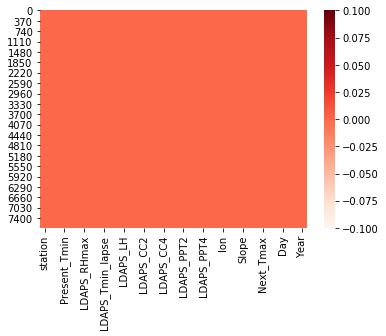

In [14]:
# Let's again check the null values after filling the same.

print(df_temp.isnull().sum())
sns.heatmap(df_temp.isnull(), cmap = 'Reds')

All the missing/null values ahve been filled.

#### STATISTICAL SUMMARY

In [15]:
df_temp.describe()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Day,Month,Year
count,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,...,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000
mean,13.000000,29.769401,23.226638,56.742728,88.388529,29.614317,23.514984,7.092549,62.450457,0.368260,...,37.544722,126.991397,61.867972,1.257048,5341.502803,30.275671,22.932804,15.979747,7.465815,2014.480134
std,7.210637,2.956583,2.403093,14.597945,7.158471,2.932911,2.334099,2.173913,33.571540,0.261236,...,0.050352,0.079435,54.279780,1.370444,429.158867,3.122585,2.483296,8.921191,0.543661,32.394355
min,1.000000,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,...,37.456200,126.826000,12.370000,0.098475,4329.520508,17.400000,11.300000,0.000000,0.000000,0.000000
25%,7.000000,27.800000,21.700000,46.046162,84.316923,27.693091,22.114651,5.686487,37.532764,0.148321,...,37.510200,126.937000,28.700000,0.271300,4999.018555,28.200000,21.400000,8.000000,7.000000,2014.000000
50%,13.000000,29.900000,23.400000,55.039024,89.793480,29.703426,23.760199,6.547470,56.865482,0.315697,...,37.550700,126.995000,45.716000,0.618000,5436.345215,30.500000,23.100000,16.000000,7.000000,2015.000000
75%,19.000000,32.000000,24.900000,67.038254,93.704500,31.683819,25.134000,8.007471,83.904586,0.571696,...,37.577600,127.042000,59.832400,1.767800,5728.316406,32.600000,24.600000,24.000000,8.000000,2016.000000
max,25.000000,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,0.967277,...,37.645000,127.135000,212.335000,5.178230,5992.895996,38.900000,29.800000,31.000000,8.000000,2017.000000


In [16]:
# Statistical summary of 'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3' and 'LDAPS_PPT4'

ld = df_temp[['LDAPS_PPT1',
       'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4']]

In [17]:
ld.describe()

,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4
count,7752.000000,7752.000000,7752.000000,7752.000000
mean,0.586267,0.480310,0.275508,0.266801
std,1.937198,1.754900,1.156495,1.200654
min,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000
75%,0.049122,0.016748,0.007231,0.000000
max,23.701544,21.621661,15.841235,16.655469


#### CORRELATION

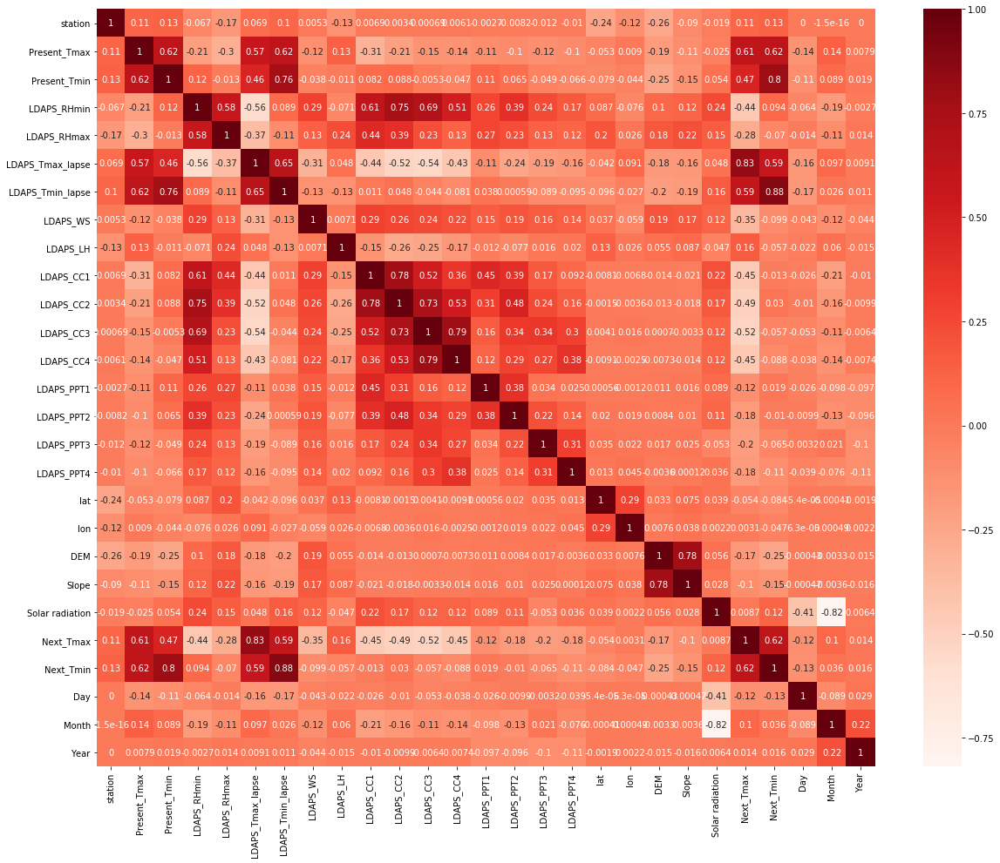

In [18]:
# Let's check the correlation among attributes using heatmap.

plt.figure(figsize=(20,16))
sns.heatmap(df_temp.corr(), cmap='Reds', annot=True)

#### UNIVARIATE ANALYSIS

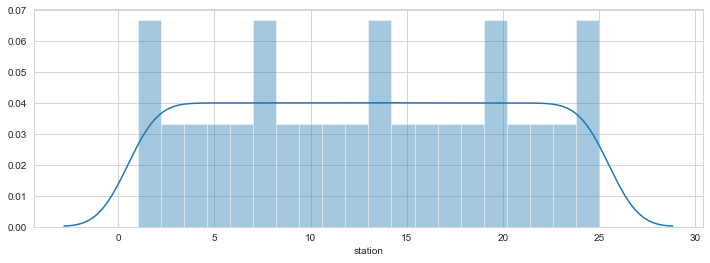

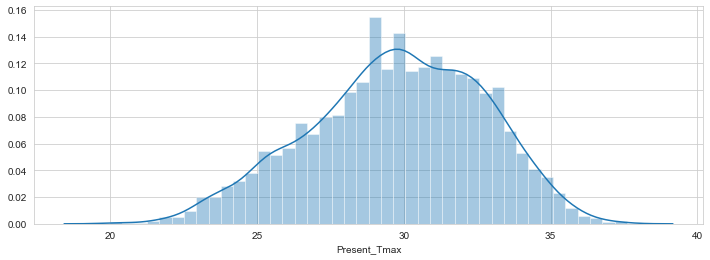

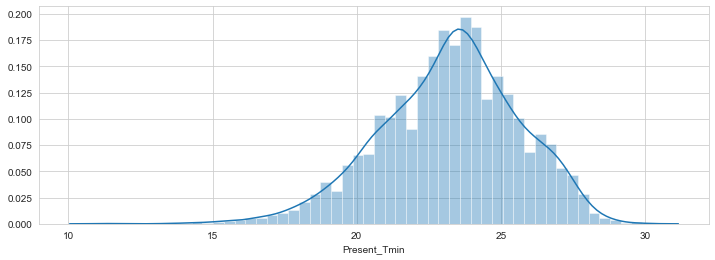

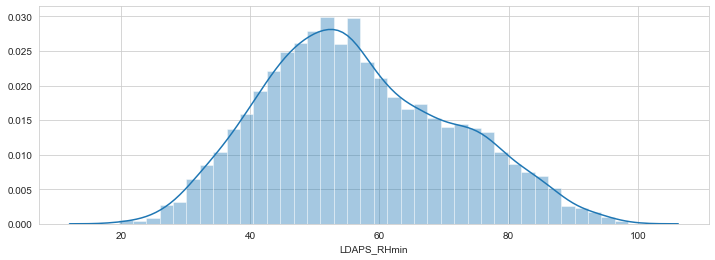

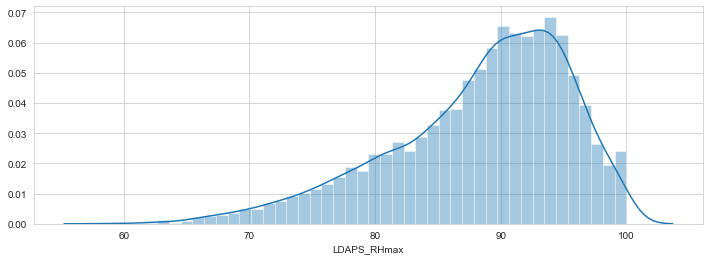

...

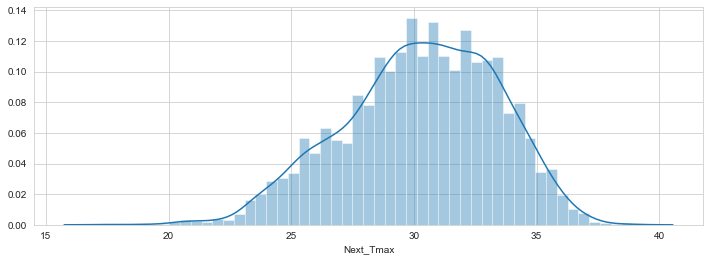

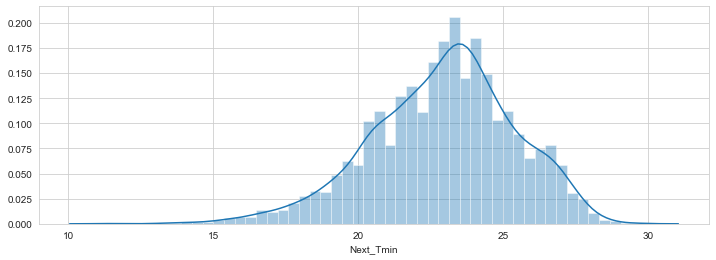

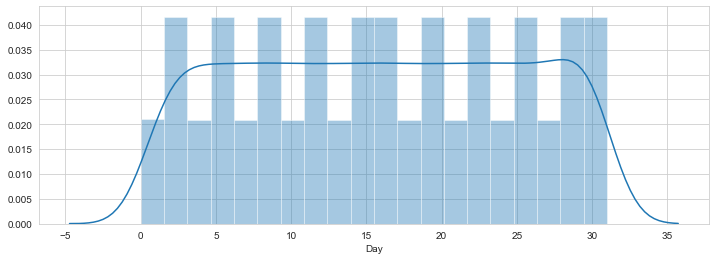

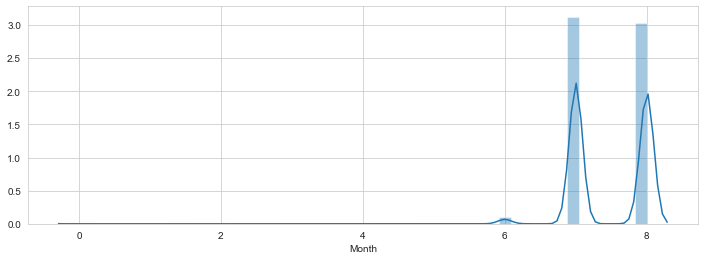

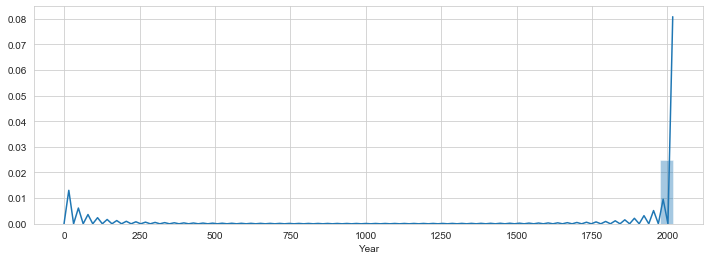

In [19]:
# Creating a list of columns having kde bandwidth more than  so that they can be visulaized.

abs_num = df_temp[['station', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax',
       'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH',
       'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1',
       'LDAPS_PPT2', 'LDAPS_PPT3', 'lat', 'lon', 'DEM', 'Slope',
       'Solar radiation', 'Next_Tmax', 'Next_Tmin', 'Day', 'Month', 'Year']]



# Visualizing the distribution of columns using distribution plot.

for i in abs_num.columns:
    sns.set_style('whitegrid')
    plt.figure(figsize=(12,4))
    x = sns.distplot(abs_num[i])
    plt.show()

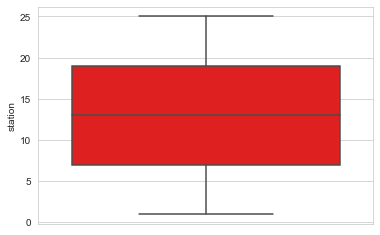

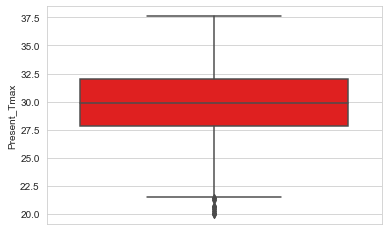

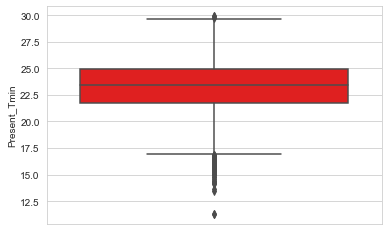

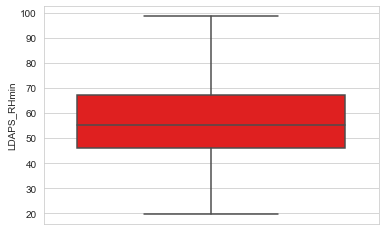

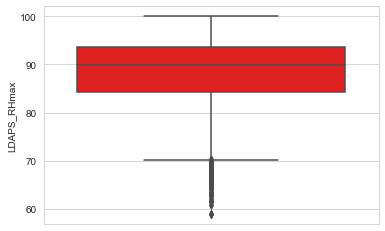

...

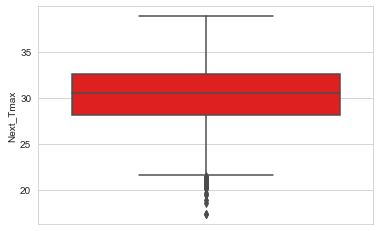

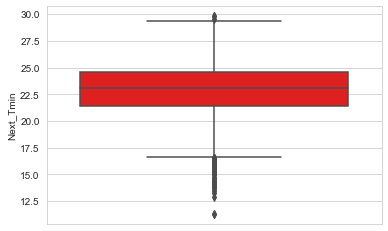

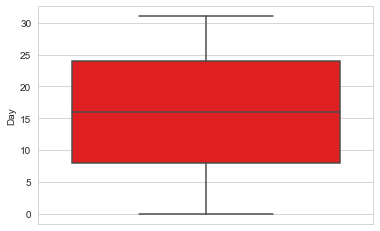

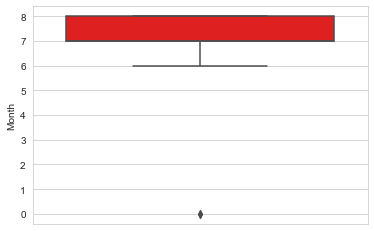

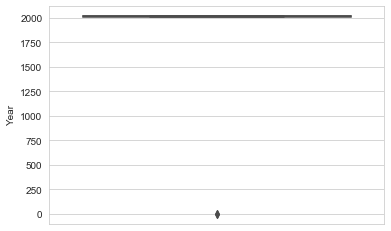

In [20]:
# Plotting the outliers.

for i in df_temp.columns:
    x = sns.boxplot(df_temp[i], data=df_temp, orient='v', color='red')
    plt.show()

From both types of plots i.e. distribution and boxplot, it is clearly seen that 'LDAPS_PPT1',
       'LDAPS_PPT2', 'LDAPS_PPT3' and 'LDAPS_PPT4' do not have much distribution and are totally positively skewd and contains the outliers too. Thus, these attributes can be removed/dropped from the dataset.

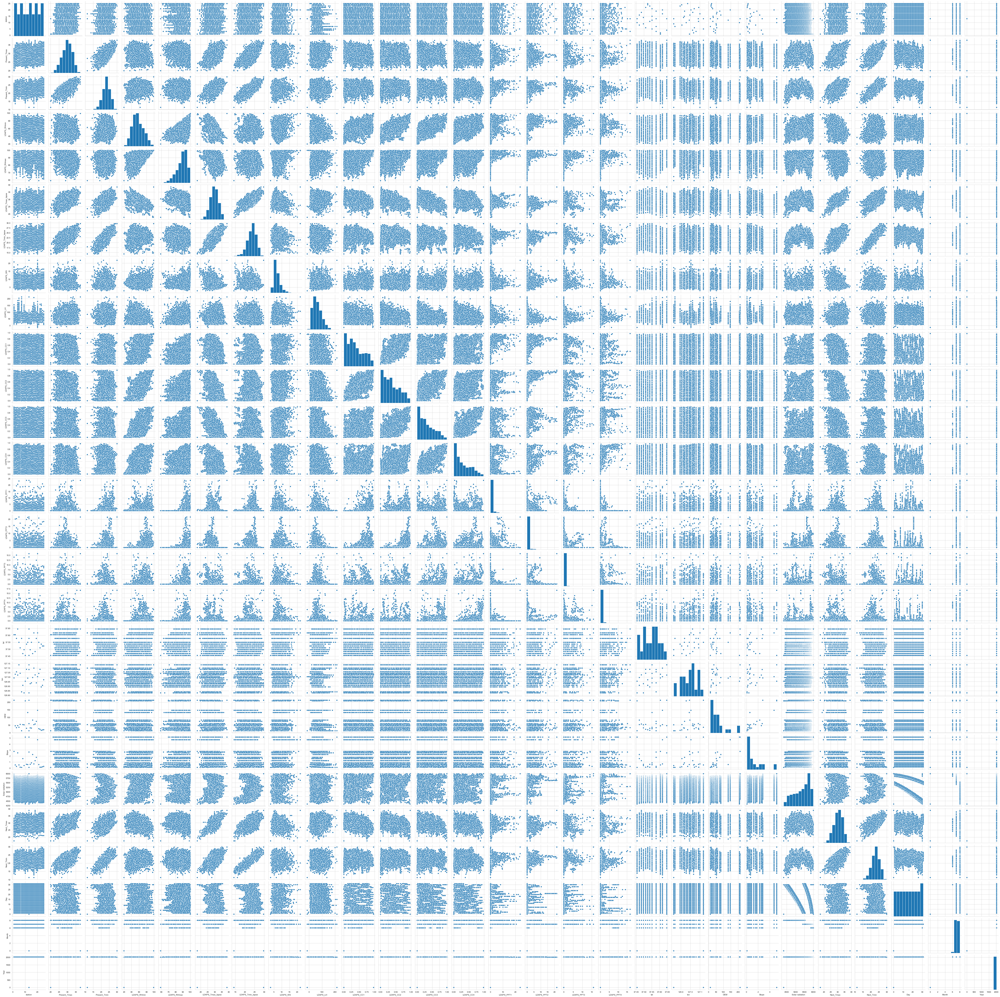

In [21]:
# Let's check the pairplot

sns.pairplot(df_temp)

#### SKEWNESS AND OUTLIERS

In [22]:
# Let's check the skewness of the data.

df_temp.skew()

station              0.000000
Present_Tmax        -0.265337
Present_Tmin        -0.369481
LDAPS_RHmin          0.303565
LDAPS_RHmax         -0.860210
LDAPS_Tmax_lapse    -0.228767
LDAPS_Tmin_lapse    -0.584737
LDAPS_WS             1.584975
LDAPS_LH             0.678315
LDAPS_CC1            0.465003
LDAPS_CC2            0.477041
LDAPS_CC3            0.646670
LDAPS_CC4            0.673700
LDAPS_PPT1           5.395178
LDAPS_PPT2           5.776835
LDAPS_PPT3           6.458608
LDAPS_PPT4           6.826930
lat                  0.087062
lon                 -0.285213
DEM                  1.723257
Slope                1.563020
Solar radiation     -0.511210
Next_Tmax           -0.340943
Next_Tmin           -0.405143
Day                 -0.009012
Month               -0.840039
Year               -62.067548
dtype: float64

In [23]:
# Let's now check the outliers and clean the data.

from scipy.stats import zscore

z = np.abs(zscore(df_temp))
print(z.shape)

# Removing the outliers.

df_temp = df_temp.loc[(z<3).all(axis=1)]
print(df_temp.shape)

(7752, 27)
(6894, 27)


In [24]:
# Let's check the skewness after removing the outliers.

df_temp.skew()

station             0.002792
Present_Tmax       -0.273950
Present_Tmin       -0.227590
LDAPS_RHmin         0.309822
LDAPS_RHmax        -0.694148
LDAPS_Tmax_lapse   -0.110448
LDAPS_Tmin_lapse   -0.386322
LDAPS_WS            1.097251
LDAPS_LH            0.574066
LDAPS_CC1           0.600830
LDAPS_CC2           0.506876
LDAPS_CC3           0.708018
LDAPS_CC4           0.720393
LDAPS_PPT1          3.749975
LDAPS_PPT2          4.869067
LDAPS_PPT3          5.515722
LDAPS_PPT4          5.969876
lat                 0.108251
lon                -0.275508
DEM                 1.764031
Slope               1.593600
Solar radiation    -0.505353
Next_Tmax          -0.270929
Next_Tmin          -0.238547
Day                 0.001007
Month              -0.192910
Year                0.010998
dtype: float64

In [25]:
# Treating the skewness with sqrt function.

for col in df_temp.columns:
    if df_temp.skew().loc[col]>0.55:
        df_temp[col]=np.sqrt(df_temp[col])

In [26]:
# Again checking the skewness after treament.

df_temp.skew()

station             0.002792
Present_Tmax       -0.273950
Present_Tmin       -0.227590
LDAPS_RHmin         0.309822
LDAPS_RHmax        -0.694148
LDAPS_Tmax_lapse   -0.110448
LDAPS_Tmin_lapse   -0.386322
LDAPS_WS            0.744890
LDAPS_LH            0.000391
LDAPS_CC1          -0.169741
LDAPS_CC2           0.506876
LDAPS_CC3          -0.095630
LDAPS_CC4           0.011958
LDAPS_PPT1          2.467298
LDAPS_PPT2          3.126900
LDAPS_PPT3          3.377404
LDAPS_PPT4          3.742141
lat                 0.108251
lon                -0.275508
DEM                 1.173601
Slope               0.882845
Solar radiation    -0.505353
Next_Tmax          -0.270929
Next_Tmin          -0.238547
Day                 0.001007
Month              -0.192910
Year                0.010998
dtype: float64

In [27]:
# Let's again check the null values after removing the outliers and reducing the skewness.

df_temp.isnull().sum()

station             0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            1
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
Day                 0
Month               0
Year                0
dtype: int64

'LDAPS_LH' is having a null value after handling the skewness and outliers. This needs to be treated.

In [28]:
# Filling the missing value in 'LDAPS_LH' with it's median.

df_temp.LDAPS_LH = df_temp.LDAPS_LH.fillna(df_temp['LDAPS_LH'].median())

In [29]:
# Let's again check the null values.

df_temp.isnull().sum()

station             0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
Day                 0
Month               0
Year                0
dtype: int64

Now, finally the dataset do not have any null values.

#### SEPERATING THE INPUT AND OUTPUT VARIABLES

In [30]:
# Let's Separating the input and target variables with the target variable Next_Tmax.

X_max = df_temp.drop(columns=["Next_Tmax"])
y_max = df_temp[["Next_Tmax"]]

In [31]:
# Let's Separating the input and target variables with the target variable Next_Tmin.

X_min = df_temp.drop(columns=["Next_Tmin"])
y_min = df_temp[["Next_Tmin"]]

In [32]:
# Let's check the shape of input and output variables.

print("Shape of input and output variables when the target variable is Next_Tmax")
print(X_max.shape)
print(y_max.shape)
print('\n')
print("Shape of input and output variables when the target variable is Next_Tmin")
print(X_min.shape)
print(y_min.shape)

Shape of input and output variables when the target variable is Next_Tmax
(6894, 26)
(6894, 1)


Shape of input and output variables when the target variable is Next_Tmin
(6894, 26)
(6894, 1)


In [33]:
# Let's check the head of the input variables.

X_max.head()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmin,Day,Month,Year
0,1.0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,2.611300,8.333775,0.483681,...,0.0,37.6046,126.991,14.571719,1.668832,5992.895996,21.2,30.0,6.0,2013.0
1,2.0,31.9,21.6,52.263397,90.604721,29.850689,24.035009,2.385768,7.206764,0.474877,...,0.0,37.6046,127.032,6.690471,0.717008,5869.312500,22.5,30.0,6.0,2013.0
2,3.0,31.6,23.3,48.690479,83.973587,30.091292,24.565633,2.477544,4.535752,0.457541,...,0.0,37.5776,127.058,5.771204,0.515849,5863.555664,23.9,30.0,6.0,2013.0
3,4.0,32.0,23.4,58.239788,96.483688,29.704629,23.326177,2.376983,8.107228,0.465158,...,0.0,37.6450,127.022,6.761361,1.592106,5856.964844,24.3,30.0,6.0,2013.0
4,5.0,31.4,21.9,56.174095,90.155128,29.113934,23.486480,2.394787,10.390647,0.389110,...,0.0,37.5507,127.135,5.919290,0.710985,5859.552246,22.5,30.0,6.0,2013.0


In [34]:
X_min.head()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Day,Month,Year
0,1.0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,2.611300,8.333775,0.483681,...,0.0,37.6046,126.991,14.571719,1.668832,5992.895996,29.1,30.0,6.0,2013.0
1,2.0,31.9,21.6,52.263397,90.604721,29.850689,24.035009,2.385768,7.206764,0.474877,...,0.0,37.6046,127.032,6.690471,0.717008,5869.312500,30.5,30.0,6.0,2013.0
2,3.0,31.6,23.3,48.690479,83.973587,30.091292,24.565633,2.477544,4.535752,0.457541,...,0.0,37.5776,127.058,5.771204,0.515849,5863.555664,31.1,30.0,6.0,2013.0
3,4.0,32.0,23.4,58.239788,96.483688,29.704629,23.326177,2.376983,8.107228,0.465158,...,0.0,37.6450,127.022,6.761361,1.592106,5856.964844,31.7,30.0,6.0,2013.0
4,5.0,31.4,21.9,56.174095,90.155128,29.113934,23.486480,2.394787,10.390647,0.389110,...,0.0,37.5507,127.135,5.919290,0.710985,5859.552246,31.2,30.0,6.0,2013.0


In [35]:
# Let's check the head of the output variables as Next_Tmax.
y_max.head()

,Next_Tmax
0,29.1
1,30.5
2,31.1
3,31.7
4,31.2


In [36]:
# Let's check the head of the output variables as Next_Tmin.
y_min.head()

,Next_Tmin
0,21.2
1,22.5
2,23.9
3,24.3
4,22.5


#### SCALING THE INPUT VARIABLES

In [37]:
# Scaling the Input variables against which the target variable is Next_Tmax.

from sklearn.preprocessing import StandardScaler

sc = StandardScaler()
X_max = sc.fit_transform(X_max)
X_max

array([[-1.6719535 , -0.43405012, -0.8291746 , ...,  1.58046553,
        -2.79903745, -1.42342268],
       [-1.5330388 ,  0.68714945, -0.74246698, ...,  1.58046553,
        -2.79903745, -1.42342268],
       [-1.3941241 ,  0.58203699, -0.00545224, ...,  1.58046553,
        -2.79903745, -1.42342268],
       ...,
       [ 1.38416996, -2.32607439, -2.69338836, ...,  1.58046553,
         0.99539067,  1.43378389],
       [ 1.52308466, -2.32607439, -2.43326551, ...,  1.58046553,
         0.99539067,  1.43378389],
       [ 1.66199936, -2.36111188, -2.56332693, ...,  1.58046553,
         0.99539067,  1.43378389]])

In [38]:
# Scaling the Input variables against which the target variable is Next_Tmin.

sc = StandardScaler()
X_min = sc.fit_transform(X_min)
X_min

array([[-1.6719535 , -0.43405012, -0.8291746 , ...,  1.58046553,
        -2.79903745, -1.42342268],
       [-1.5330388 ,  0.68714945, -0.74246698, ...,  1.58046553,
        -2.79903745, -1.42342268],
       [-1.3941241 ,  0.58203699, -0.00545224, ...,  1.58046553,
        -2.79903745, -1.42342268],
       ...,
       [ 1.38416996, -2.32607439, -2.69338836, ...,  1.58046553,
         0.99539067,  1.43378389],
       [ 1.52308466, -2.32607439, -2.43326551, ...,  1.58046553,
         0.99539067,  1.43378389],
       [ 1.66199936, -2.36111188, -2.56332693, ...,  1.58046553,
         0.99539067,  1.43378389]])

#### TRAINING AND TESTING THE DIFFERENT ALGORITHMS

In [39]:
# Importing the neccesary sklearn libraries.

from sklearn.linear_model import Lasso, LinearRegression, Ridge
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error,mean_squared_error, r2_score
from sklearn import linear_model

In [40]:
# Splitting the training and testing data and finding the maximum r2 score at random state.

def max_r2_score (reg, X, y):
    max_r_scr = 0
    for r_state in range(42,101):
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .20, random_state = r_state)
        reg.fit(X_train, y_train)
        pred = reg.predict(X_test)
        r2_scr = r2_score(y_test, pred)
        if r2_scr > max_r_scr:
            max_r_scr = r2_scr
            final_r_state = r_state
            
    print("Maximum r2 score :", max_r_scr, "achieved at", final_r_state)
    print('\n')
    print("Mean Absolute Error : ",np.sqrt(mean_absolute_error(y_test, pred)))
    print('\n')
    print("RMSE : ",np.sqrt(mean_squared_error(y_test, pred)))

In [41]:
# Creating the instances for the algorithms.

lr = LinearRegression()
lreg = Lasso()
rg = Ridge()
sv = SVR()
dtr = DecisionTreeRegressor()
knnr = KNeighborsRegressor()
rfr = RandomForestRegressor()

In [42]:
models = []
models.append(('LinearRegression', lr))
models.append(('Lasso', lreg))
models.append(('Ridge', rg))
models.append(('SVR', sv))
models.append(('DecisionTreeRegressor', dtr))
models.append(('KNeighborsRegressor', knnr))
models.append(('RandomForestRegressor', rfr))

#### Results of different algorithms tested, TARGET VARIABLE being 'Next_Tmax'

In [43]:
# Creating a list which holds the algorithms.

model = []
cvs = []

for name,model in models:
    k=model
    print('--------',name,'--------')
    r_state = max_r2_score(k, X_max, y_max)
    print('\n')
    mR2 = cross_val_score(k,  X_max, y_max, cv=5, scoring = "r2").mean()
    print('Cross validation score (Mean r2 score):', mR2)
    stdR2 = cross_val_score(k,  X_max, y_max, cv=5, scoring = "r2").std()
    print('Standard Deviationin r2 score :', stdR2)
    print('\n')
    print('\n')

-------- LinearRegression --------
Maximum r2 score : 0.8024116047509938 achieved at 78


Mean Absolute Error :  1.0331893430062071


RMSE :  1.4053926765477718


Cross validation score (Mean r2 score): 0.6631050032316279
Standard Deviationin r2 score : 0.06065745720362111




-------- Lasso --------
Maximum r2 score : 0.5498869020574626 achieved at 97


Mean Absolute Error :  1.262439139877661


RMSE :  2.0175043523911804


Cross validation score (Mean r2 score): 0.47552878485860317
Standard Deviationin r2 score : 0.06384761747346374




-------- Ridge --------
Maximum r2 score : 0.802382667346691 achieved at 78


Mean Absolute Error :  1.0332018414125514


RMSE :  1.4053121901522176


Cross validation score (Mean r2 score): 0.6636415015458151
Standard Deviationin r2 score : 0.060119446886040345




-------- SVR --------
Maximum r2 score : 0.8997270799016266 achieved at 84


Mean Absolute Error :  0.8528095799005347


RMSE :  1.0041017704063773


Cross validation score (Mean r2 score)

RandomForestRegressor is selected as a model for the target variable 'Next_Tmax' as it is giving the best score among all the algorithms tested having r2 score = 0.91 at random state 78.

#### Results of different algorithms tested, TARGET VARIABLE being 'Next_Tmin'

In [44]:
# Creating a list which holds the algorithms.

model = []
cvs = []

for name,model in models:
    k=model
    print('--------',name,'--------')
    r_state = max_r2_score(k, X_min, y_min)
    print('\n')
    mR2 = cross_val_score(k,  X_min, y_min, cv=5, scoring = "r2").mean()
    print('Cross validation score (Mean r2 score):', mR2)
    stdR2 = cross_val_score(k,  X_min, y_min, cv=5, scoring = "r2").std()
    print('Standard Deviationin r2 score :', stdR2)
    print('\n')
    print('\n')

-------- LinearRegression --------
Maximum r2 score : 0.8568228937094778 achieved at 74


Mean Absolute Error :  0.8671809813151882


RMSE :  0.9521989983929268


Cross validation score (Mean r2 score): 0.7889659731580323
Standard Deviationin r2 score : 0.07148307535924539




-------- Lasso --------
Maximum r2 score : 0.6113070959940734 achieved at 91


Mean Absolute Error :  1.0899114938201757


RMSE :  1.4985758029371026


Cross validation score (Mean r2 score): 0.5164954313394831
Standard Deviationin r2 score : 0.08362069354686615




-------- Ridge --------
Maximum r2 score : 0.856812148065424 achieved at 74


Mean Absolute Error :  0.8671928532350658


RMSE :  0.9521231533997223


Cross validation score (Mean r2 score): 0.7890173220212475
Standard Deviationin r2 score : 0.07144068205629837




-------- SVR --------
Maximum r2 score : 0.9254998741868325 achieved at 74


Mean Absolute Error :  0.7211222650636441


RMSE :  0.6806825144424478


Cross validation score (Mean r2 score):

SVR is selected as a model for the target variable 'Next_Tmin' as it is giving the best score among all the algorithms tested having r2 score = 0.92 at random state 74.

In [45]:
# saving the model using joblib
from sklearn.externals import joblib

# Save the model as a pickle in a file
joblib.dump(sv, 'temp.pkl')

['temp.pkl']